# Single-pass style transfer
## Artificial Intelligence (IF1017) - Center of Informatics - UFPE
**Team: Gabriel Tavares, Gabriel Vasconcelos and Bruno Carvalho**

\

This notebook builds on top of some amazing repos and papers which are listed at the end in the "References" section

## Setup


In [ ]:
%matplotlib inline

# install dependencies
!pip install Pillow -U
!pip install onnxruntime onnx

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth

# download style image
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 84.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.3 MB/s eta 0:00:00
--2025-04-08 23:35:17--  http://images.cocodataset.org/zips/train2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.21.159, 16.182.33.209, 52.217.235.137, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.21.159|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13510573713 (13G) [application/zip]
Saving to: ‘train2014.zip’

train2014.zip       100%[===================>]  12.58G  15.8MB/s    in 14m 27s 

2025-04-08 23:49:44 (14.9 MB/s) - ‘train2014.zip’ saved [13510573713/13510573713]

/content/train
/content
--2025-04-08 23:52:07--  https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth
Resolving web.eecs

## Imports and constants

In [ ]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import onnx
import onnxruntime as ort
import numpy as np
from torchsummary import summary
import time
import kagglehub

In [ ]:
paintings_path = kagglehub.dataset_download("momincks/paintings-for-artistic-style-transfer")

In [ ]:
!ls $paintings_path

'Camille Pissarro - Boulevard Montmartre.jpg'
'Edvard Munch - Anxiety.jpg'
'Edvard Munch - The Scream.jpg'
'Katsushika Hokusai - Fine Breezy Day.jpg'
'Katsushika Hokusai - The Great Wave off Kanagawa.jpg'
'Leonardo Da Vinci - Lady with an Ermine.jpg'
'Leonardo Da Vinci - Portrait of Lisa Gherardini.jpg'
'Lubo Kristek - Naddas Chord in the Landscape.jpg'
'Oscar Florianus Bluemner - Old Canal Port.jpg'
'Paul Nash - The Menin Road.jpg'
'Salvador Dali - The Persistence of Memory.jpg'
'Vincent Van Gogh - Le caf de nuit.jpg'
'Vincent Van Gogh - Sunflowers.jpg'
'Vincent Van Gogh - The bedroom.jpg'
'Vincent Van Gogh - The Olive Trees.jpg'
'Vincent Van Gogh - The Starry Night (1888).jpg'
'Vincent Van Gogh - The Starry Night.jpg'
'Vincent Van Gogh - The Yellow House.jpg'


In [ ]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg" # os.path.joint(paintings_path, "some.jpg")
BATCH_SIZE = 4
CONTENT_WEIGHT = 17
STYLE_WEIGHT = 55
TV_WEIGHT = 1e-6
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 1000 # 2,000 Images with batch size 4
SEED = 42

## Utility functions

### Reproducibility

In [ ]:
def set_seed(seed):
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # Leave as True to ensure determinism. Some operations may crash
    torch.use_deterministic_algorithms(False)
    np.random.seed(seed)
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(SEED)

### Image manipulation

In [ ]:
def load_image(filename: str) -> np.ndarray:
    """
    Loads an RGB image from the specified file using OpenCV.

    Args:
        filename (str): Path to the image file.

    Returns:
        np.ndarray: The loaded image as a NumPy array in RGB color format.
    """
    image = cv2.imread(filename, cv2.IMREAD_COLOR_RGB)
    return image

In [ ]:
def show_image(image: np.ndarray, figsize: tuple = (7, 7)):
    """
    Displays an image using Matplotlib.

    Args:
        image (np.ndarray): The image to display, expected as a NumPy array.
        figsize (tuple, optional): Size of the figure in inches. Defaults to (7, 7).

    Notes:
        - Assumes image is in RGB format
        - The image is converted to float32 and normalized to [0, 1] for display.
        - Axes and grid lines are turned off for a cleaner view.
    """
    image = np.float32(image) / 255
    image = image.clip(0, 1)

    plt.figure(figsize=figsize)
    plt.imshow(image)
    plt.gca().axis("off")
    plt.gca().grid(False)
    plt.show()

In [ ]:
def save_image(image: np.ndarray, filename: str) -> bool:
    """
    Saves an image to the specified file using OpenCV.

    Args:
        image (np.ndarray): The image to save.
        filename (str): The path where the image will be saved.

    Returns:
        bool: True if the image was successfully written, False otherwise.
    """
    if image.max() > 255:
        image = image.clip(0, 255)
    return cv2.imwrite(filename, image)

In [ ]:
def image_to_tensor(image: np.ndarray, max_size: int = None) -> torch.Tensor:
    """
    Converts an image (NumPy array) to a PyTorch tensor, optionally resizing it
    while maintaining aspect ratio.

    Args:
        image (np.ndarray): Input image in HWC format (height, width, channels), values in [0, 255].
        max_size (int, optional): If specified, resizes the image so the longest edge matches max_size.

    Returns:
        torch.Tensor: A 4D tensor (1, C, H, W) with pixel values in [0, 255].
    """
    if max_size is None:
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.mul(255))
        ])
    else:
        height, width, _ = image.shape
        scale = float(max_size) / max(height, width)
        new_size = (int(height * scale), int(width * scale))
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize(new_size),
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.mul(255))
        ])

    tensor = transform(image).unsqueeze(0)
    return tensor

In [ ]:
def tensor_to_image(tensor: torch.Tensor) -> np.ndarray:
    """
    Converts a PyTorch tensor to a NumPy image array.

    Args:
        tensor (torch.Tensor): A 3D or 4D tensor with shape (C, H, W) or (1, C, H, W),
                               with pixel values typically in [0, 255].

    Returns:
        np.ndarray: The image as a NumPy array with shape (H, W, C).
    """
    if tensor.dim() == 4:
        tensor = tensor.squeeze(0)

    image = tensor.detach().cpu().numpy()
    image = image.transpose(1, 2, 0)
    return image

In [ ]:
def transfer_color(source: np.ndarray, target: np.ndarray, weight: float = 1.0) -> np.ndarray:
    """
    Transfers color information from a source image to a target image using the YCrCb color space.
    This is useful for preserving source color characteristics during style transfer.

    Assumes input images are in BGR format and have shape (H, W, C).

    Args:
        source (np.ndarray): Source image in BGR format (provides color information).
        target (np.ndarray): Target image in BGR format (provides luminance/structure).
        weight (float): Style Y-channel weight. Defaults to 1.0

    Returns:
        np.ndarray: Color-transferred image in BGR format.
    """
    source = np.clip(source, 0, 255)
    target = np.clip(target, 0, 255)
    weight = np.clip(weight, 0, 1)

    # Resize target to match source dimensions
    h, w, _ = source.shape
    target_resized = cv2.resize(target, (w, h), interpolation=cv2.INTER_CUBIC)

    # Extract target luminance and source chroma
    target_gray = cv2.cvtColor(target_resized, cv2.COLOR_BGR2GRAY)
    source_gray = cv2.cvtColor(source, cv2.COLOR_BGR2GRAY)
    source_ycc = cv2.cvtColor(source, cv2.COLOR_BGR2YCrCb)
    source_ycc[..., 0] = weight * target_gray + (1 - weight) * source_gray

    # Convert back to BGR
    result = cv2.cvtColor(source_ycc, cv2.COLOR_YCrCb2BGR)
    return np.clip(result, 0, 255)

### Loss function and feature extraction

In [ ]:
def gram(tensor: torch.Tensor) -> torch.Tensor:
    """
    Computes the Gram matrix for a batch of feature maps.

    Args:
        tensor (Tensor): Feature maps with shape (B, C, H, W)

    Returns:
        Tensor: Gram matrices with shape (B, C, C)
    """
    B, C, H, W = tensor.shape
    features = tensor.view(B, C, H * W)            # (B, C, H*W)
    features_t = features.transpose(1, 2)          # (B, H*W, C)
    gram_matrix = torch.bmm(features, features_t)  # (B, C, C)
    gram_matrix = gram_matrix / (C * H * W)        # Normalize

    return gram_matrix

In [ ]:
class VGG16Extractor(nn.Module):
    """
    A feature extractor based on VGG16 for style transfer and perceptual loss tasks.
    Extracts intermediate activations from specific layers commonly used in neural style transfer.

    Layers extracted:
        - relu1_2
        - relu2_2
        - relu3_3
        - relu4_3

    Args:
        vgg_path (str): Path to the pre-trained VGG16 weights (.pth file).
    """
    def __init__(self, vgg_path: str = "models/vgg16-00b39a1b.pth"):
        super().__init__()

        vgg16 = models.vgg16(pretrained=False)
        weights = torch.load(vgg_path, weights_only=False)
        vgg16.load_state_dict(weights, strict=False)

        self.features = vgg16.features
        self.target_layers = {
            '3': 'relu1_2',
            '8': 'relu2_2',
            '15': 'relu3_3',
            '22': 'relu4_3'
        }

        # Freeze all VGG16 parameters
        for param in self.features.parameters():
            param.requires_grad = False

    def forward(self, x: torch.Tensor) -> dict:
        """
        Forward pass that extracts feature maps from specified VGG16 layers.

        Args:
            x (torch.Tensor): Input image tensor of shape (B, 3, H, W), normalized for VGG.

        Returns:
            dict: Dictionary mapping layer names to their corresponding feature maps.
        """
        features = {}
        for name, layer in self.features._modules.items():
            x = layer(x)
            if name in self.target_layers:
                features[self.target_layers[name]] = x
                if name == '22':
                    break

        return features

## Building models

### Components

In [ ]:
class ConvLayer(nn.Module):
    """
    A convolutional layer with reflection padding followed by optional normalization.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        kernel_size (int): Size of the convolutional kernel.
        stride (int): Stride of the convolution.
        norm (str): Type of normalization ('instance', 'batch', or 'None').
    """
    def __init__(self, in_channels, out_channels, kernel_size, stride, norm="instance"):
        super().__init__()
        padding_size = kernel_size // 2
        self.reflection_pad = nn.ReflectionPad2d(padding_size)
        self.conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size, stride)

        self.norm_type = norm.lower()
        if self.norm_type == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif self.norm_type == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)
        else:
            self.norm_layer = None

    def forward(self, x):
        x = self.reflection_pad(x)
        x = self.conv_layer(x)
        if self.norm_layer:
            x = self.norm_layer(x)
        return x

In [ ]:
class ResidualLayer1(nn.Module):
    """
    A residual block with two ConvLayers and ReLU activation.

    Implements:
        output = x + F(x)
    where F(x) is two ConvLayer blocks with shared channel dimensions.

    Args:
        channels (int): Number of channels for the input and output.
        kernel_size (int): Kernel size for both convolutions.
    """
    def __init__(self, channels=128, kernel_size=3):
        super().__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size, stride=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = ConvLayer(channels, channels, kernel_size, stride=1)

    def forward(self, x):
        identity = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out)
        return out + identity

In [ ]:
class DeconvLayer(nn.Module):
    """
    A transposed convolution layer for upsampling, followed by optional normalization.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        kernel_size (int): Kernel size for transposed convolution.
        stride (int): Stride of the transposed convolution.
        output_padding (int): Additional size added to one side of the output.
        norm (str): Type of normalization ('instance', 'batch', or 'None').
    """
    def __init__(self, in_channels, out_channels, kernel_size, stride, output_padding, norm="instance"):
        super().__init__()
        padding_size = kernel_size // 2
        self.conv_transpose = nn.ConvTranspose2d(
            in_channels, out_channels, kernel_size, stride,
            padding=padding_size, output_padding=output_padding
        )

        self.norm_type = norm.lower()
        if self.norm_type == "instance":
            self.norm_layer = nn.InstanceNorm2d(out_channels, affine=True)
        elif self.norm_type == "batch":
            self.norm_layer = nn.BatchNorm2d(out_channels, affine=True)
        else:
            self.norm_layer = None

    def forward(self, x):
        x = self.conv_transpose(x)
        if self.norm_layer:
            x = self.norm_layer(x)
        return x

In [ ]:
class ResidualLayer2(nn.Module):
    """
    A residual bottleneck block with optional downsampling.
    Useful in encoder-style architectures where feature resolution reduction is needed.

    Structure:
        - Project input to hidden size
        - Two Conv + InstanceNorm + ReLU layers
        - Optional downsampling with AvgPool
        - Add residual connection (with downsampling if needed)
        - Project back to output size

    Args:
        in_channels (int): Number of input channels.
        hdn_channels (int): Number of hidden/bottleneck channels.
        out_channels (int): Number of output channels.
        kernel_size (int): Size of convolution kernels (default: 3).
        downsampling_factor (int): Factor for downsampling via stride and avg pooling (default: 2).
    """
    def __init__(
        self,
        in_channels: int,
        hdn_channels: int,
        out_channels: int,
        kernel_size: int = 3,
        downsampling_factor: int = 2
    ):
        super().__init__()

        padding = kernel_size // 2

        self.proj1 = nn.Conv2d(in_channels, hdn_channels, kernel_size=1)

        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(padding),
            nn.Conv2d(hdn_channels, hdn_channels, kernel_size, stride=downsampling_factor),
            nn.InstanceNorm2d(hdn_channels, affine=True),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(padding),
            nn.Conv2d(hdn_channels, hdn_channels, kernel_size, stride=1),
            nn.InstanceNorm2d(hdn_channels, affine=True),
            nn.ReLU(inplace=True)
        )

        self.avg_pool = (
            nn.AvgPool2d(kernel_size=downsampling_factor, stride=downsampling_factor)
            if downsampling_factor > 1 else nn.Identity()
        )

        self.proj2 = nn.Conv2d(hdn_channels, out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x_proj = self.proj1(x)
        out = self.conv_block(x_proj) + self.avg_pool(x_proj)
        out = self.proj2(out)
        return out

In [ ]:
class ConvUpsample1(nn.Module):
    """
    A decoder-style convolutional block with bilinear upsampling.

    Applies a convolution and upsamples the result.

    Args:
        in_channels (int): Number of input channels before concatenation.
        out_channels (int): Number of output channels after convolution.
        kernel_size (int): Size of the convolutional kernel. Default: 3.
        upsample_factor (int): Scaling factor for bilinear upsampling. Default: 2.
    """
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int = 3,
        upsample_factor: int = 2
    ):
        super().__init__()
        padding_size = kernel_size // 2

        self.conv = nn.Conv2d(
            in_channels,  # assuming skip connection has same channel size as x
            out_channels,
            kernel_size=kernel_size,
            padding=padding_size
        )

        self.upsample = nn.Upsample(scale_factor=upsample_factor, mode='bilinear', align_corners=False)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass.

        Args:
            x (Tensor): Input tensor to be upsampled.

        Returns:
            Tensor: Output tensor after convolution and upsampling.
        """
        out = self.conv(x)
        out = self.act(self.upsample(out))
        return out

In [ ]:
class ConvUpsample2(nn.Module):
    """
    A decoder-style convolutional block with skip connections and bilinear upsampling.

    Concatenates the current feature map with a skip connection, applies a convolution,
    and upsamples the result.

    Args:
        in_channels (int): Number of input channels before concatenation.
        out_channels (int): Number of output channels after convolution.
        kernel_size (int): Size of the convolutional kernel. Default: 3.
        upsample_factor (int): Scaling factor for bilinear upsampling. Default: 2.
    """
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int = 3,
        upsample_factor: int = 2
    ):
        super().__init__()
        padding_size = kernel_size // 2

        self.conv = nn.Conv2d(
            in_channels * 2,  # assuming skip connection has same channel size as x
            out_channels,
            kernel_size=kernel_size,
            padding=padding_size
        )

        self.upsample = nn.Upsample(scale_factor=upsample_factor, mode='bilinear', align_corners=False)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor, skip: torch.Tensor) -> torch.Tensor:
        """
        Forward pass.

        Args:
            x (Tensor): Input tensor to be upsampled.
            skip (Tensor): Skip connection tensor to be concatenated.

        Returns:
            Tensor: Output tensor after convolution and upsampling.
        """
        x_skip = torch.cat((x, skip), dim=1)
        out = self.conv(x_skip)
        out = self.act(self.upsample(out))
        return out

### Architectures

The first architecture is really similar to the original "Fast Style Transfer" algorithm but optimized for latency and memory by us.

In [ ]:
class StyleTransferNet1(nn.Module):
    """
    Feedforward style transfer network based on:
    "Perceptual Losses for Real-Time Style Transfer and Super-Resolution"
    https://arxiv.org/abs/1603.08155

    Architecture:
        - Initial convolution block with downsampling
        - 4 residual layers
        - Transposed convolution block with upsampling
        - Final conv layer (no Tanh or Sigmoid; use raw RGB output)

    Note:
        Input/Output range is expected to be in [0, 255].
    """
    def __init__(self):
        super().__init__()

        # Downsampling convolutional block
        self.conv_block = nn.Sequential(
            ConvLayer(3, 32, kernel_size=9, stride=1),
            nn.ReLU(inplace=True),
            ConvLayer(32, 32, kernel_size=3, stride=2),
            nn.ReLU(inplace=True),
            ConvLayer(32, 32, kernel_size=3, stride=2),
            nn.ReLU(inplace=True)
        )

        # Residual transformation block
        self.residual_block = nn.Sequential(
            ResidualLayer1(32, kernel_size=3),
            ResidualLayer1(32, kernel_size=3),
            ResidualLayer1(32, kernel_size=3)
        )

        # Upsampling block
        self.deconv_block = nn.Sequential(
            DeconvLayer(32, 32, kernel_size=3, stride=2, output_padding=1),
            nn.ReLU(inplace=True),
            DeconvLayer(32, 16, kernel_size=3, stride=2, output_padding=1),
            nn.ReLU(inplace=True),
            ConvLayer(16, 3, kernel_size=9, stride=1, norm="None")
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass through the style transfer network.

        Args:
            x (Tensor): Input image tensor of shape (B, 3, H, W)

        Returns:
            Tensor: Stylized output image tensor of same shape
        """
        o1 = self.conv_block(x)
        o2 = self.residual_block(o1)
        o3 = self.deconv_block(o2)
        return o3

The second one is an experimentation with a UNet-like architecture. Unfortunately, it seems that although the skip-connections help preserve structure really well, the style is not properly incorporated and the results are unsatisfactory.

In [ ]:
class StyleTransferNet2(nn.Module):
    """
    U-Net-style Residual Style Transfer Network.

    Architecture:
        - Encoder: 3 downsampling residual blocks
        - Bottleneck: Deepest feature transformation
        - Decoder: 3 upsampling blocks with skip connections
        - Final convolution layers to map back to RGB space

    Args:
        in_channels (int): Number of input image channels (default: 3 for RGB)
        init_features (int): Base number of feature channels. Controls model width (default: 4)
    """
    def __init__(
        self,
        in_channels: int = 3,
        init_features: int = 2
    ):
        super().__init__()

        # Encoder
        self.encoder1 = ResidualLayer2(in_channels, init_features, init_features * 4, kernel_size=3, downsampling_factor=2)
        self.encoder2 = ResidualLayer2(init_features * 4, init_features * 4, init_features * 8, kernel_size=3, downsampling_factor=2)
        self.encoder3 = ResidualLayer2(init_features * 8, init_features * 8, init_features * 8, kernel_size=3, downsampling_factor=2)

        # Bottleneck
        self.bottleneck = ResidualLayer2(init_features * 8, init_features * 8, init_features * 8, kernel_size=3, downsampling_factor=1)

        # Decoder
        self.decoder1 = ConvUpsample2(init_features * 8, init_features * 8)
        self.decoder2 = ConvUpsample2(init_features * 8, init_features * 4)
        self.decoder3 = ConvUpsample2(init_features * 4, init_features)

        # Final output conv block
        self.final_conv = nn.Sequential(
            nn.Conv2d(init_features, init_features, kernel_size=3, padding=1),
            nn.Conv2d(init_features, init_features, kernel_size=3, padding=1),
            nn.Conv2d(init_features, in_channels, kernel_size=3, padding=1)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        Forward pass for style transformation.

        Args:
            x (Tensor): Input image tensor of shape (B, C, H, W)

        Returns:
            Tensor: Stylized output image tensor of same shape
        """
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)

        bottleneck = self.bottleneck(enc3)

        dec1 = self.decoder1(bottleneck, enc3)
        dec2 = self.decoder2(dec1, enc2)
        dec3 = self.decoder3(dec2, enc1)

        out = self.final_conv(dec3)
        return out

## Training

In [ ]:
def train(model_cls):
    # Set device
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Dataset + Loader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Models
    style_transfer_model = model_cls().to(device)
    summary(
        style_transfer_model,
            (3, TRAIN_IMAGE_SIZE, TRAIN_IMAGE_SIZE),
        batch_size = BATCH_SIZE,
        device = device
    )
    vgg = VGG16Extractor(vgg_path="/content/vgg16-00b39a1b.pth").to(device)

    # Preprocess style image
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1, 3, 1, 1).to(device)
    style_image = load_image(STYLE_IMAGE_PATH)
    style_tensor = image_to_tensor(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)

    B, C, H, W = style_tensor.shape
    with torch.no_grad():
        style_features = vgg(style_tensor.expand([BATCH_SIZE, C, H, W]))
        style_grams = {k: gram(v).detach() for k, v in style_features.items()}

    # Loss and optimizer
    optimizer = optim.Adam(style_transfer_model.parameters(), lr=ADAM_LR)
    mse_loss = nn.MSELoss()

    # Tracking
    content_loss_history, style_loss_history, total_loss_history = [], [], []
    batch_content_loss_sum, batch_style_loss_sum, batch_total_loss_sum = 0.0, 0.0, 0.0

    batch_count = 1
    start_time = time.time()

    for epoch in range(1, NUM_EPOCHS + 1):
        print(f"======== Epoch {epoch}/{NUM_EPOCHS} ========")
        for batch_id, (content_batch, _) in enumerate(train_loader):
            curr_batch_size = content_batch.size(0)
            content_batch = content_batch[:, [2, 1, 0]].to(device)  # RGB to BGR

            optimizer.zero_grad()
            generated_batch = style_transfer_model(content_batch)

            with torch.no_grad():
                content_features = vgg(content_batch.add(imagenet_neg_mean))

            generated_features = vgg(generated_batch.add(imagenet_neg_mean))

            # Content loss
            content_loss = CONTENT_WEIGHT * mse_loss(
                content_features["relu2_2"],
                generated_features["relu2_2"]
            )

            # Style loss
            style_loss = 0
            for key in generated_features:
                g_gram = gram(generated_features[key])
                s_gram = style_grams[key][:curr_batch_size]
                style_loss += mse_loss(g_gram, s_gram)
            style_loss *= STYLE_WEIGHT

            # Total loss
            total_loss = content_loss + style_loss

            # Backprop + Update
            total_loss.backward()
            optimizer.step()

            # Logging
            batch_content_loss_sum += content_loss.item()
            batch_style_loss_sum += style_loss.item()
            batch_total_loss_sum += total_loss.item()

            if ((batch_count - 1) % SAVE_MODEL_EVERY == 0) or (batch_count == NUM_EPOCHS * len(train_loader)):
                avg_content = batch_content_loss_sum / batch_count
                avg_style = batch_style_loss_sum / batch_count
                avg_total = batch_total_loss_sum / batch_count

                print(f"======== Iteration {batch_count}/{NUM_EPOCHS * len(train_loader)} ========")
                print(f"\tContent Loss:\t{avg_content:.2f}")
                print(f"\tStyle Loss:\t{avg_style:.2f}")
                print(f"\tTotal Loss:\t{avg_total:.2f}")
                print(f"\tTime Elapsed:\t{time.time() - start_time:.2f}s")

                # Save model
                checkpoint_path = f"{SAVE_MODEL_PATH}checkpoint_{batch_count - 1}.pth"
                torch.save(style_transfer_model.state_dict(), checkpoint_path)
                print(f"Saved checkpoint to {checkpoint_path}")

                # Save and show image
                sample_tensor = generated_batch[0].detach().unsqueeze(0)
                sample_image = tensor_to_image(sample_tensor)
                sample_path = f"{SAVE_IMAGE_PATH}sample0_{batch_count - 1}.png"
                save_image(sample_image, sample_path)
                show_image(sample_image)
                print(f"Saved sample image to {sample_path}")

                # Save losses
                content_loss_history.append(avg_content)
                style_loss_history.append(avg_style)
                total_loss_history.append(avg_total)

                torch.cuda.empty_cache()

            batch_count += 1

    print("\n======== Training Finished ========")
    print(f"Total time: {time.time() - start_time:.2f} sec")

    # Final model save
    style_transfer_model.eval().cpu()
    torch.save(style_transfer_model.state_dict(), f"{SAVE_MODEL_PATH}transformer_weight.pth")
    print(f"Saved final weights to {SAVE_MODEL_PATH}transformer_weight.pth")
    return style_transfer_model

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1           [4, 3, 264, 264]               0
            Conv2d-2          [4, 32, 256, 256]           7,808
    InstanceNorm2d-3          [4, 32, 256, 256]              64
         ConvLayer-4          [4, 32, 256, 256]               0
              ReLU-5          [4, 32, 256, 256]               0
   ReflectionPad2d-6          [4, 32, 258, 258]               0
            Conv2d-7          [4, 32, 128, 128]           9,248
    InstanceNorm2d-8          [4, 32, 128, 128]              64
         ConvLayer-9          [4, 32, 128, 128]               0
             ReLU-10          [4, 32, 128, 128]               0
  ReflectionPad2d-11          [4, 32, 130, 130]               0
           Conv2d-12            [4, 32, 64, 64]           9,248
   InstanceNorm2d-13            [4, 32, 64, 64]              64
        ConvLayer-14            [4, 32,

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


======== Epoch 1/1 ========
======== Iteration 1/20696 ========
	Content Loss:	3020727.25
	Style Loss:	249568848.00
	Total Loss:	252589568.00
	Time Elapsed:	0.36s
Saved checkpoint to /content/checkpoint_0.pth


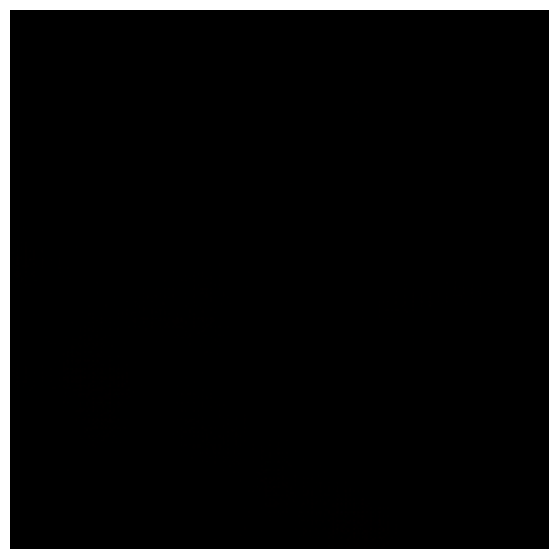

Saved sample image to /content/sample0_0.png
======== Iteration 1001/20696 ========
	Content Loss:	9061609.58
	Style Loss:	50628918.79
	Total Loss:	59690528.37
	Time Elapsed:	192.21s
Saved checkpoint to /content/checkpoint_1000.pth


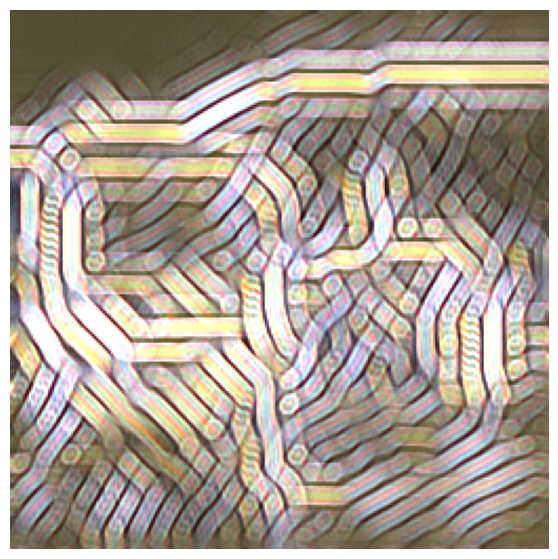

Saved sample image to /content/sample0_1000.png
======== Iteration 2001/20696 ========
	Content Loss:	9626511.52
	Style Loss:	29765841.12
	Total Loss:	39392352.64
	Time Elapsed:	383.31s
Saved checkpoint to /content/checkpoint_2000.pth


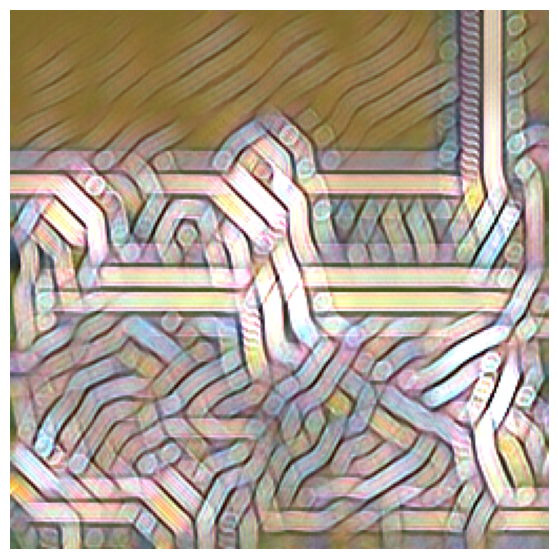

Saved sample image to /content/sample0_2000.png
======== Iteration 3001/20696 ========
	Content Loss:	9709913.38
	Style Loss:	21973437.44
	Total Loss:	31683350.81
	Time Elapsed:	574.16s
Saved checkpoint to /content/checkpoint_3000.pth


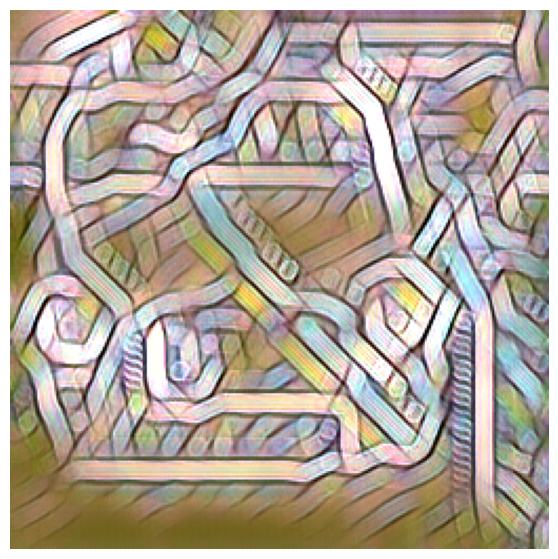

Saved sample image to /content/sample0_3000.png
======== Iteration 4001/20696 ========
	Content Loss:	9654749.85
	Style Loss:	17707949.34
	Total Loss:	27362699.18
	Time Elapsed:	771.95s
Saved checkpoint to /content/checkpoint_4000.pth


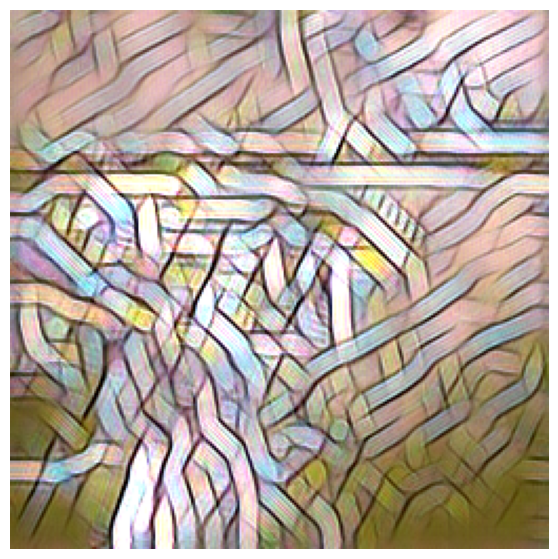

Saved sample image to /content/sample0_4000.png
======== Iteration 5001/20696 ========
	Content Loss:	9544990.36
	Style Loss:	14973566.69
	Total Loss:	24518557.04
	Time Elapsed:	970.82s
Saved checkpoint to /content/checkpoint_5000.pth


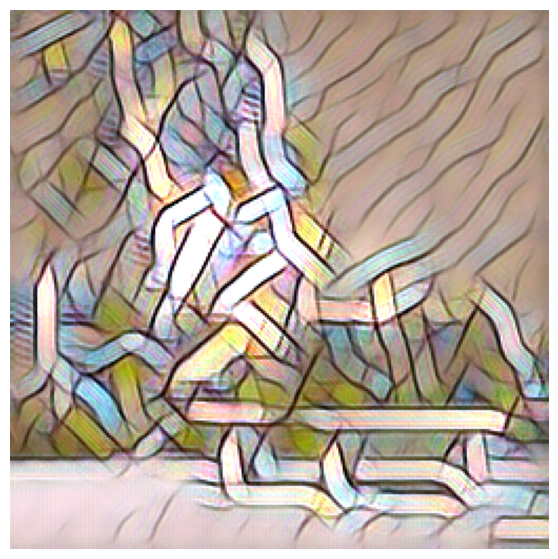

Saved sample image to /content/sample0_5000.png
======== Iteration 6001/20696 ========
	Content Loss:	9420278.40
	Style Loss:	13046306.95
	Total Loss:	22466585.34
	Time Elapsed:	1169.38s
Saved checkpoint to /content/checkpoint_6000.pth


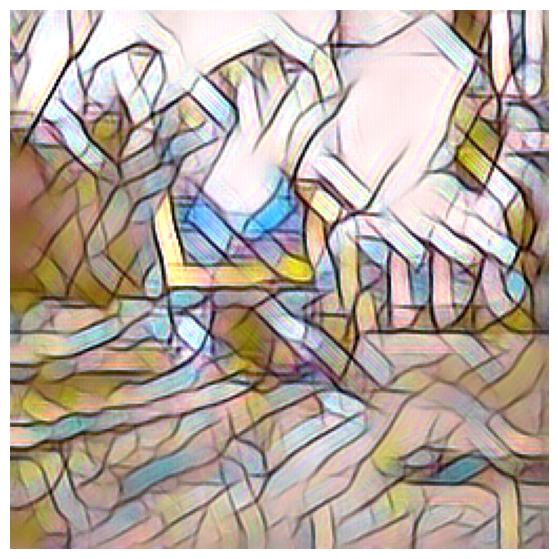

Saved sample image to /content/sample0_6000.png
======== Iteration 7001/20696 ========
	Content Loss:	9283078.76
	Style Loss:	11613683.41
	Total Loss:	20896762.17
	Time Elapsed:	1368.51s
Saved checkpoint to /content/checkpoint_7000.pth


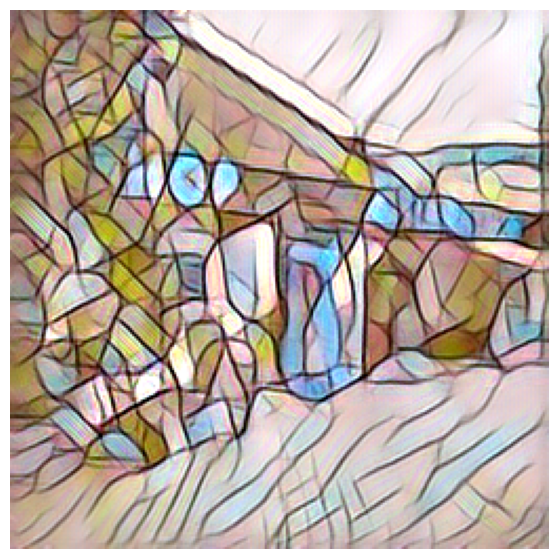

Saved sample image to /content/sample0_7000.png
======== Iteration 8001/20696 ========
	Content Loss:	9144411.94
	Style Loss:	10505465.78
	Total Loss:	19649877.72
	Time Elapsed:	1568.15s
Saved checkpoint to /content/checkpoint_8000.pth


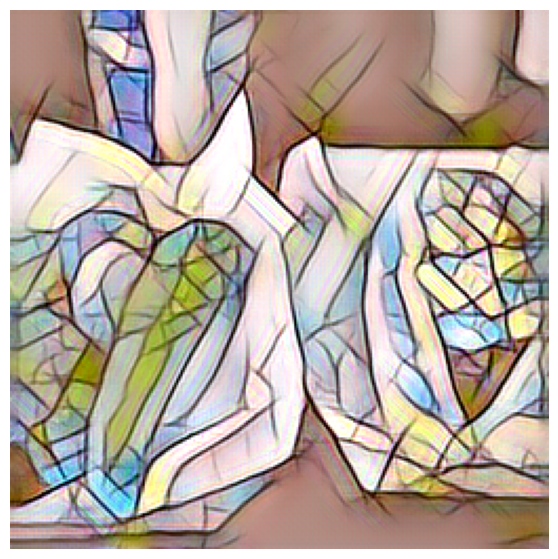

Saved sample image to /content/sample0_8000.png
======== Iteration 9001/20696 ========
	Content Loss:	9018796.89
	Style Loss:	9629414.99
	Total Loss:	18648211.87
	Time Elapsed:	1767.71s
Saved checkpoint to /content/checkpoint_9000.pth


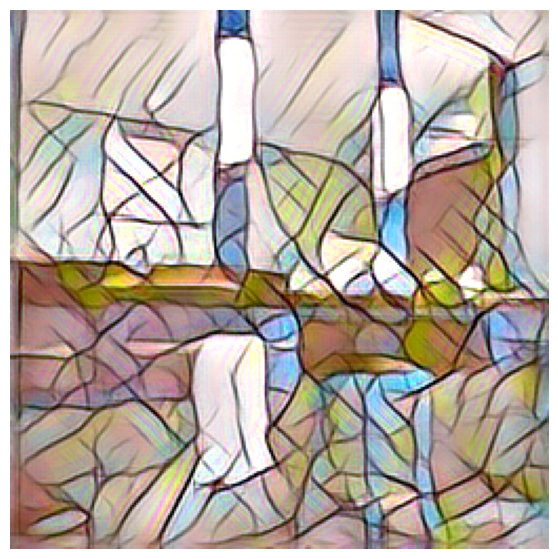

Saved sample image to /content/sample0_9000.png
======== Iteration 10001/20696 ========
	Content Loss:	8906782.76
	Style Loss:	8919234.35
	Total Loss:	17826017.11
	Time Elapsed:	1966.86s
Saved checkpoint to /content/checkpoint_10000.pth


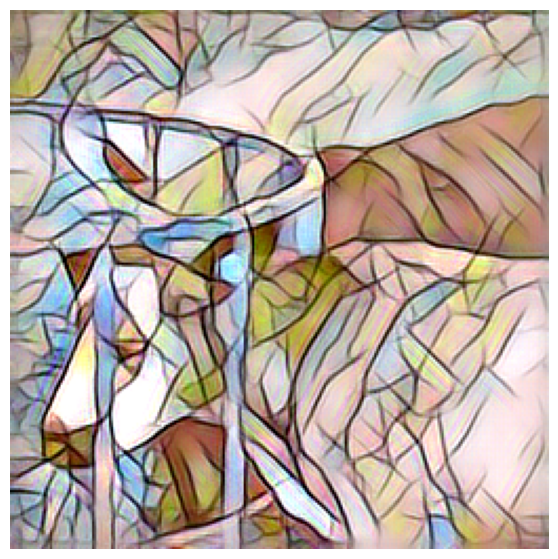

Saved sample image to /content/sample0_10000.png
======== Iteration 11001/20696 ========
	Content Loss:	8804514.05
	Style Loss:	8330333.97
	Total Loss:	17134848.01
	Time Elapsed:	2166.03s
Saved checkpoint to /content/checkpoint_11000.pth


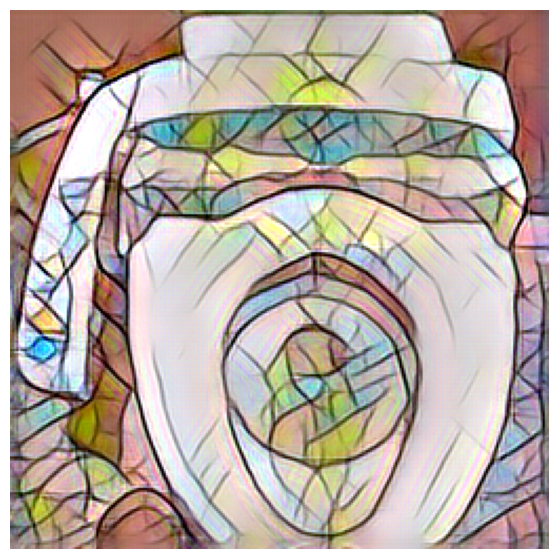

Saved sample image to /content/sample0_11000.png
======== Iteration 12001/20696 ========
	Content Loss:	8713873.24
	Style Loss:	7836498.10
	Total Loss:	16550371.34
	Time Elapsed:	2365.40s
Saved checkpoint to /content/checkpoint_12000.pth


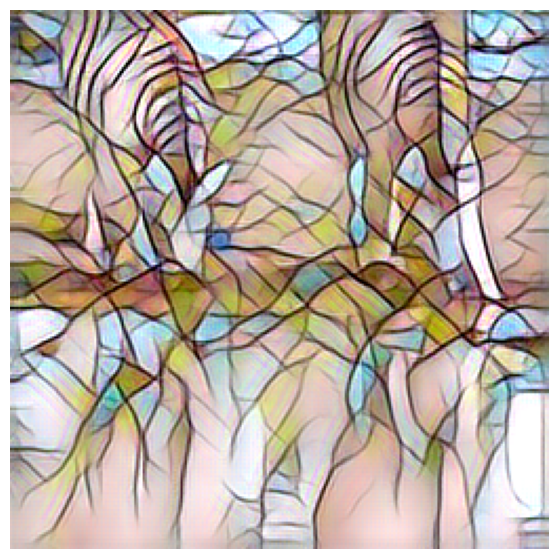

Saved sample image to /content/sample0_12000.png
======== Iteration 13001/20696 ========
	Content Loss:	8631639.83
	Style Loss:	7415318.79
	Total Loss:	16046958.63
	Time Elapsed:	2564.61s
Saved checkpoint to /content/checkpoint_13000.pth


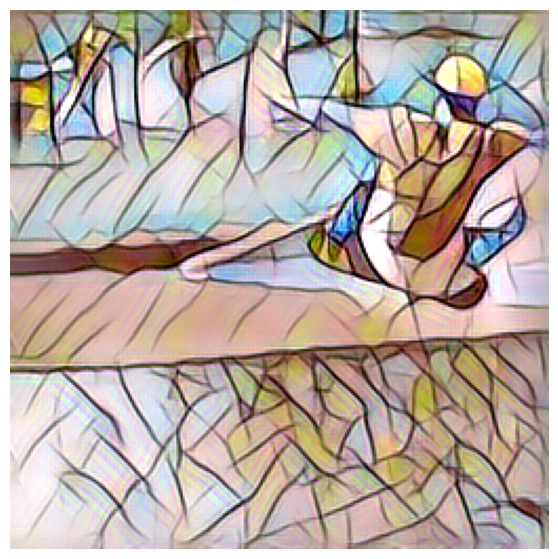

Saved sample image to /content/sample0_13000.png
======== Iteration 14001/20696 ========
	Content Loss:	8557680.93
	Style Loss:	7049821.09
	Total Loss:	15607502.02
	Time Elapsed:	2763.98s
Saved checkpoint to /content/checkpoint_14000.pth


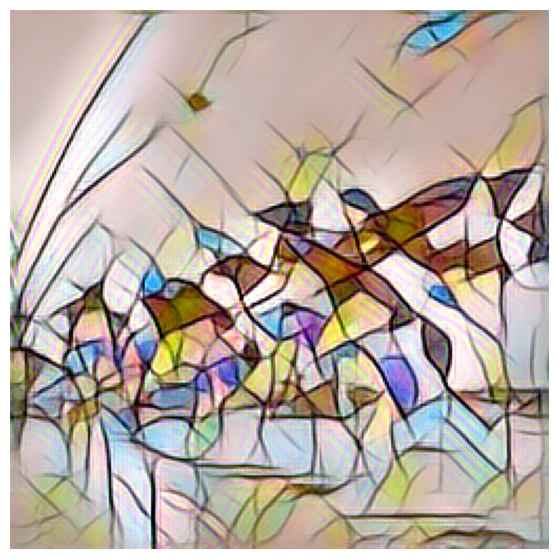

Saved sample image to /content/sample0_14000.png
======== Iteration 15001/20696 ========
	Content Loss:	8492053.15
	Style Loss:	6732259.28
	Total Loss:	15224312.42
	Time Elapsed:	2963.14s
Saved checkpoint to /content/checkpoint_15000.pth


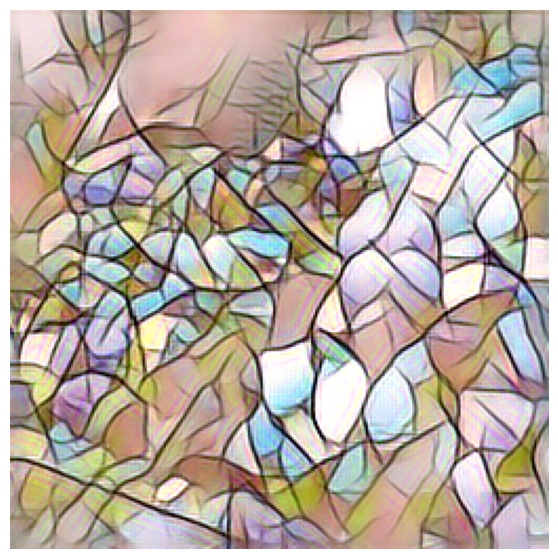

Saved sample image to /content/sample0_15000.png
======== Iteration 16001/20696 ========
	Content Loss:	8434050.87
	Style Loss:	6454901.09
	Total Loss:	14888951.96
	Time Elapsed:	3162.24s
Saved checkpoint to /content/checkpoint_16000.pth


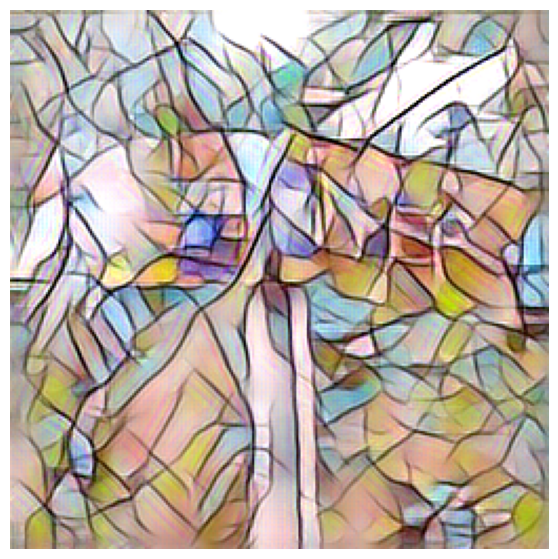

Saved sample image to /content/sample0_16000.png
======== Iteration 17001/20696 ========
	Content Loss:	8379779.00
	Style Loss:	6205712.03
	Total Loss:	14585491.03
	Time Elapsed:	3361.19s
Saved checkpoint to /content/checkpoint_17000.pth


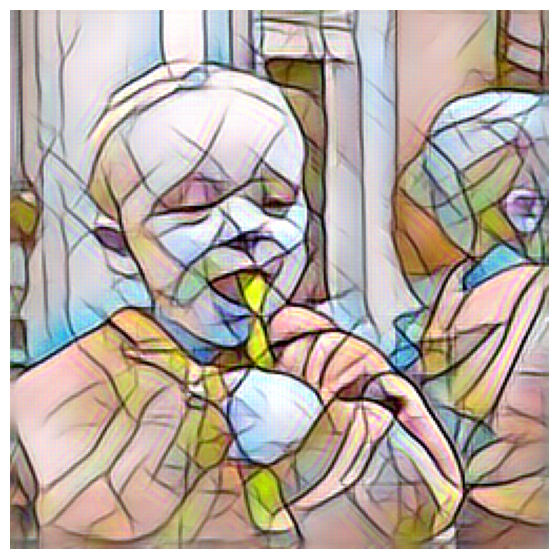

Saved sample image to /content/sample0_17000.png
======== Iteration 18001/20696 ========
	Content Loss:	8329675.62
	Style Loss:	5983739.57
	Total Loss:	14313415.19
	Time Elapsed:	3560.27s
Saved checkpoint to /content/checkpoint_18000.pth


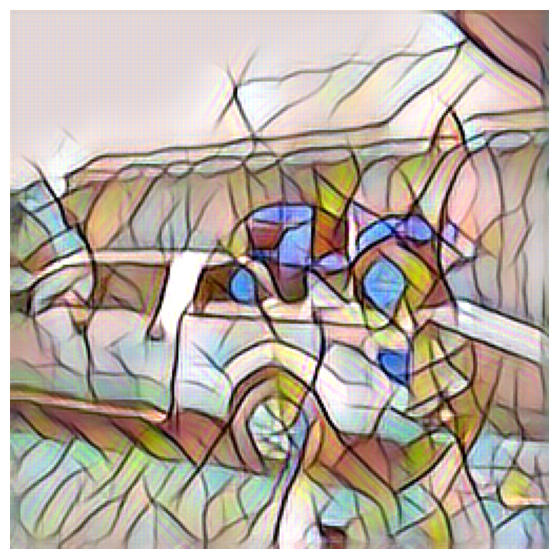

Saved sample image to /content/sample0_18000.png
======== Iteration 19001/20696 ========
	Content Loss:	8284302.77
	Style Loss:	5785072.20
	Total Loss:	14069374.97
	Time Elapsed:	3759.42s
Saved checkpoint to /content/checkpoint_19000.pth


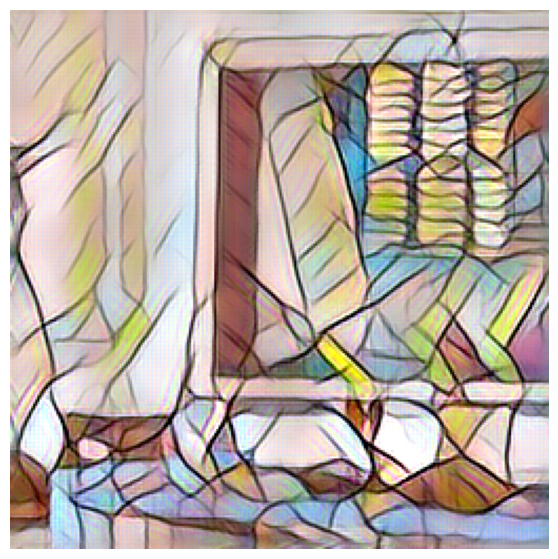

Saved sample image to /content/sample0_19000.png
======== Iteration 20001/20696 ========
	Content Loss:	8243123.69
	Style Loss:	5605390.51
	Total Loss:	13848514.20
	Time Elapsed:	3958.26s
Saved checkpoint to /content/checkpoint_20000.pth


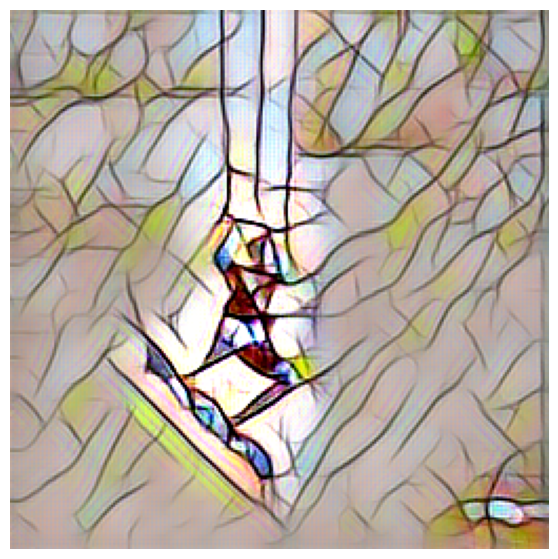

Saved sample image to /content/sample0_20000.png
======== Iteration 20696/20696 ========
	Content Loss:	8215135.18
	Style Loss:	5490086.50
	Total Loss:	13705221.68
	Time Elapsed:	4096.49s
Saved checkpoint to /content/checkpoint_20695.pth


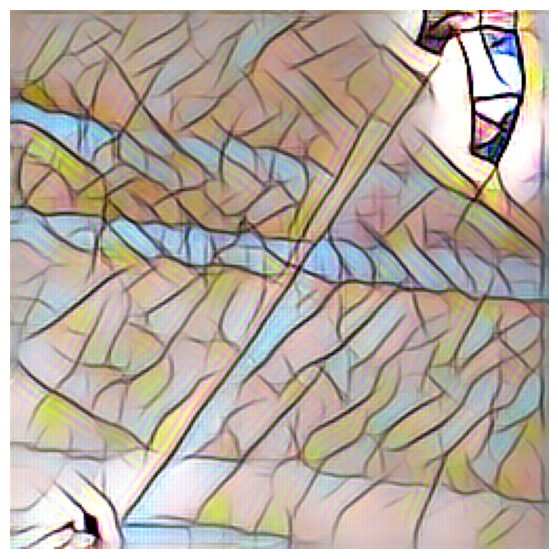

Saved sample image to /content/sample0_20695.png

======== Training Finished ========
Total time: 4096.77 sec
Saved final weights to /content/transformer_weight.pth


In [ ]:
style_transfer_model = train(StyleTransferNet1)

## Visual testing

Since a ground truth doesn't exist, we need to settle with a little visual inspection. We'll leave an out-of-sample image here.

In [ ]:
!wget https://sipi.usc.edu/database/preview/misc/4.2.03.png -O sample.png

--2025-04-09 01:20:30--  https://sipi.usc.edu/database/preview/misc/4.2.03.png
Resolving sipi.usc.edu (sipi.usc.edu)... 68.181.2.90
Connecting to sipi.usc.edu (sipi.usc.edu)|68.181.2.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 38496 (38K) [image/png]
Saving to: ‘sample.png’

sample.png          100%[===================>]  37.59K   235KB/s    in 0.2s    

2025-04-09 01:20:31 (235 KB/s) - ‘sample.png’ saved [38496/38496]



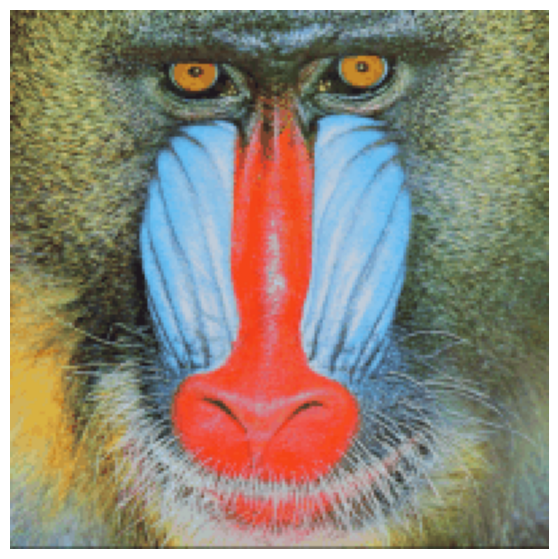

In [ ]:
# img = cv2.imread("train/train2014/COCO_train2014_000000000025.jpg", cv2.IMREAD_COLOR_RGB)
img = load_image("sample.png")
show_image(img)

In [ ]:
preprocessing = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(TRAIN_IMAGE_SIZE),
    transforms.CenterCrop(TRAIN_IMAGE_SIZE),
    transforms.Lambda(lambda x: x.mul(255))
])

In [ ]:
img_tensor = preprocessing(img)

In [ ]:
img_tensor.shape, img_tensor.max()

(torch.Size([3, 256, 256]), tensor(246.))

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = StyleTransferNet1().to(device)
model.load_state_dict(torch.load("/content/transformer_weight.pth", map_location=device))
model.eval()

StyleTransferNet1(
  (conv_block): Sequential(
    (0): ConvLayer(
      (reflection_pad): ReflectionPad2d((4, 4, 4, 4))
      (conv_layer): Conv2d(3, 32, kernel_size=(9, 9), stride=(1, 1))
      (norm_layer): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    )
    (1): ReLU(inplace=True)
    (2): ConvLayer(
      (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
      (conv_layer): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2))
      (norm_layer): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    )
    (3): ReLU(inplace=True)
    (4): ConvLayer(
      (reflection_pad): ReflectionPad2d((1, 1, 1, 1))
      (conv_layer): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2))
      (norm_layer): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    )
    (5): ReLU(inplace=True)
  )
  (residual_block): Sequential(
    (0): ResidualLayer1(
      (conv1): ConvLayer(
        (reflection_p

In [ ]:
with torch.no_grad():
    result = model(img_tensor.to(device))

In [ ]:
result = result.cpu().squeeze(0).clip(0, 255).permute(1, 2, 0).numpy()

In [ ]:
result.shape, result.min(), result.max()

((256, 256, 3), np.float32(0.0), np.float32(255.0))

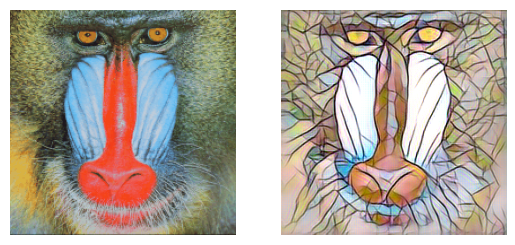

In [ ]:
fig, ax = plt.subplots(1, 2)
ax[0].imshow(img)
ax[0].axis("off")
ax[0].grid(False)

ax[1].imshow(result / 255)
ax[1].axis("off")
ax[1].grid(False)

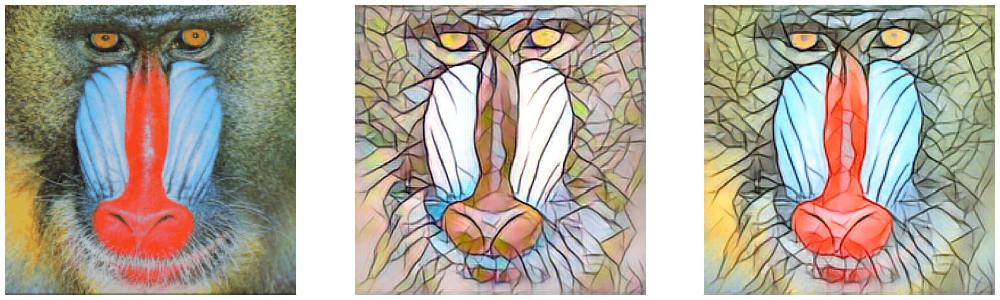

In [ ]:
final_result = transfer_color(img, result.astype("uint8"))

fig, ax = plt.subplots(1, 3, figsize=(25, 10))
ax[0].imshow(img)
ax[0].axis("off")
ax[0].grid(False)

ax[1].imshow(result / 255)
ax[1].axis("off")
ax[1].grid(False)

ax[2].imshow(final_result)
ax[2].axis("off")
ax[2].grid(False)

## Exporting model

In [ ]:
model.eval()
for module in model.modules():
    module.eval()

In [ ]:
model.eval()

torch.onnx.export(
    model.cpu(),
    img_tensor.unsqueeze(0),
    "style_transfer_mosaic.onnx",
    export_params=True,
    opset_version=11,  # Use a stable opset version
    do_constant_folding=True,
    input_names=['input'],
    output_names=['output'],
    dynamic_axes={
        'input': {0: 'batch_size', 2: 'height', 3: 'width'},
        'output': {0: 'batch_size', 2: 'height', 3: 'width'}
    }
)

In [ ]:
with torch.no_grad():
    pytorch_output = model(img_tensor)

ort_session = ort.InferenceSession("style_transfer_mosaic.onnx")

input_name = ort_session.get_inputs()[0].name
onnx_input = {input_name: img_tensor.unsqueeze(0).numpy()}

onnx_output = ort_session.run(None, onnx_input)[0][0]

np.testing.assert_allclose(
    pytorch_output.numpy(),
    onnx_output,
    rtol=1e-3,
    atol=1e-3
)

## References

1. [State-of-the-Art Style Transfer on StyleBench – Papers with Code](https://paperswithcode.com/sota/style-transfer-on-stylebench)  
2. [PyTorch Neural Style Transfer Tutorial](https://pytorch.org/tutorials/advanced/neural_style_tutorial.html)  
3. [GitHub – gordicaleksa/pytorch-neural-style-transfer](https://github.com/gordicaleksa/pytorch-neural-style-transfer)  
4. Gatys, L.A., Ecker, A.S., & Bethge, M. (2015). [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576)  
5. Johnson, J., Alahi, A., & Fei-Fei, L. (2016). [Perceptual Losses for Real-Time Style Transfer and Super-Resolution](https://arxiv.org/abs/1505.04597)  
6. [GitHub – rrmina/fast-neural-style-pytorch](https://github.com/rrmina/fast-neural-style-pytorch/tree/master)
